# Style transfer using GAN
This notebook will be used to prepare the capstone project 'Style transfer using GAN'. Our goal in this project is to convert T1 type MRI images into T2 type MRI images.

In [1]:
#Import all the required libraries

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
import imageio
import glob
import os
import pandas as pd
from PIL import Image

## Image Processing 
1. We create a function to process the images with normalisation

2. Apply the function to both the datasets 

3. Visualise the MRI images after processing


In [2]:
BATCH_SIZE = 1

In [3]:
t1_directory = r'D:\Pratik\Style Transfer with GAN 256x256\GAN data\Tr1\TrainT1'
t2_directory = r'D:\Pratik\Style Transfer with GAN 256x256\GAN data\Tr2\TrainT2'

In [4]:
def image_to_np_array(image_path):
    """
    Read an image from file and convert it to a numpy array.
    """
    image = Image.open(image_path)
    return np.array(image)

def read_images_to_dataframe(image_dir):
    """
    Read all images from the specified directory into a Pandas DataFrame.
    """
    image_data = []
    for filename in os.listdir(image_dir):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            image_path = os.path.join(image_dir, filename)
            image_array = image_to_np_array(image_path)
            image_data.append({'filename': filename, 'image_array': image_array})
    return pd.DataFrame(image_data)

t1_data_raw = read_images_to_dataframe(t1_directory)
t2_data_raw = read_images_to_dataframe(t2_directory)
t1_data = t1_data_raw['image_array']
t2_data = t2_data_raw['image_array']
t1_data = (t1_data/127.5) - 1
t2_data = (t2_data/127.5) - 1
print(t1_data.head())
print(t2_data.head())

0    [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
1    [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
2    [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
3    [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
4    [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
Name: image_array, dtype: object
0    [[-0.9764705882352941, -0.9686274509803922, -0...
1    [[-0.9764705882352941, -0.9686274509803922, -0...
2    [[-0.9764705882352941, -0.9686274509803922, -0...
3    [[-0.9764705882352941, -0.9686274509803922, -0...
4    [[-0.9764705882352941, -0.9764705882352941, -0...
Name: image_array, dtype: object


T1 type image

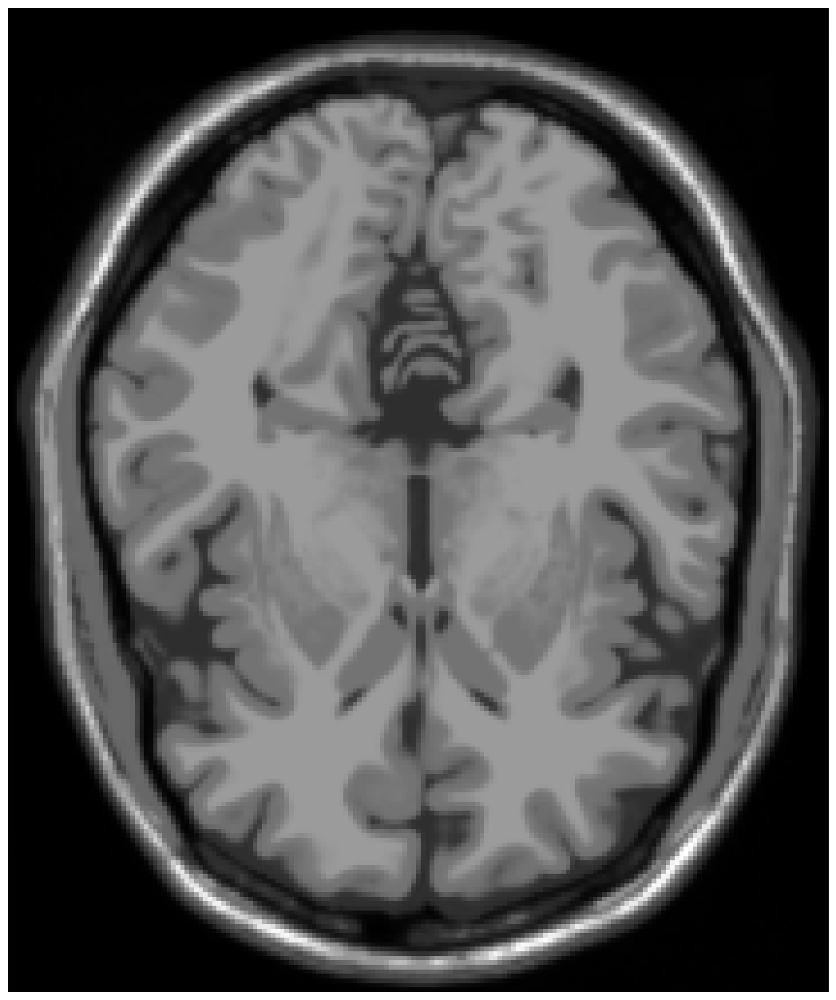

In [5]:
plt.figure(figsize=(16, 16))
plt.imshow(t1_data[0], cmap='gray')
plt.axis('off')
plt.show()


T2 type image

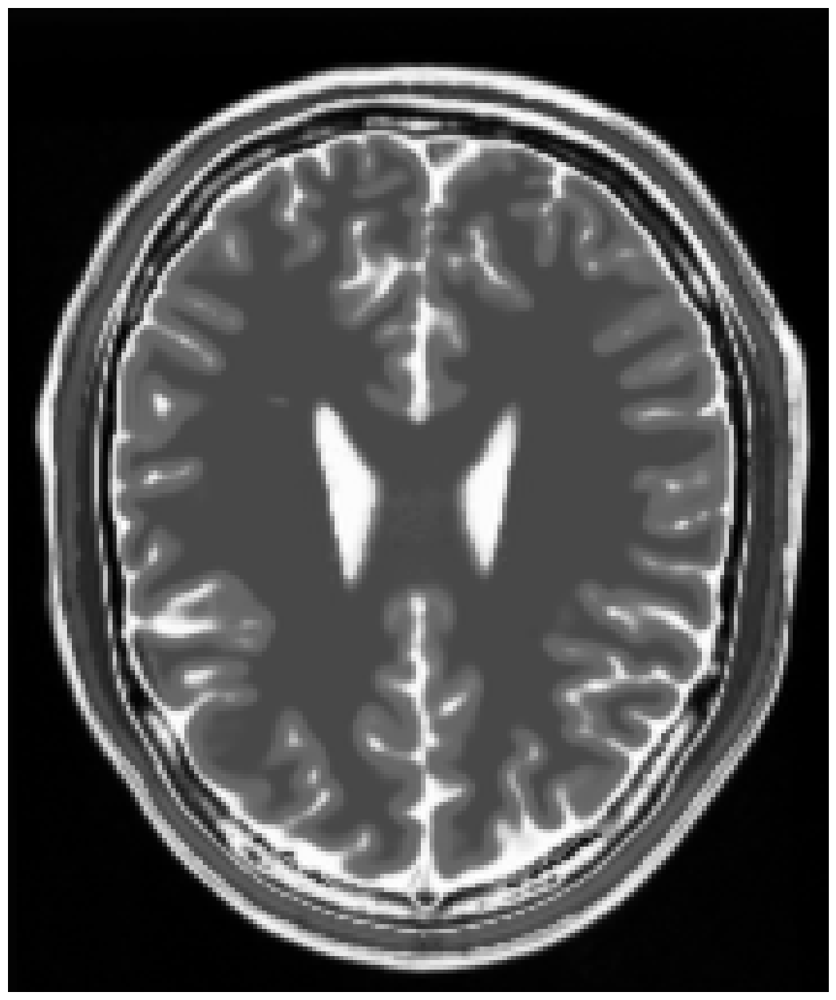

In [6]:
plt.figure(figsize=(16, 16))
plt.imshow(t2_data[0], cmap='gray')
plt.axis('off')
plt.show()

Now we preprocess the images to create data that will be used for training the models.

We resize the data to (256,256)

In [7]:
t1_data_resize = np.zeros((t1_data.shape[0], 256, 256))
for index, img in enumerate(t1_data):
    t1_data_resize[index, :, :] = resize(img, (256, 256))
t1_data_resize.shape

(43, 256, 256)

In [8]:
t2_data_resize = np.zeros((t2_data.shape[0], 256, 256))
for index, img in enumerate(t2_data):
    t2_data_resize[index, :, :] = resize(img, (256, 256))
t2_data_resize.shape

(46, 256, 256)

We reshape the numpy arrays derived from the images and cast them as float32 for ease of training

In [9]:
t1_data_resize = t1_data_resize.reshape(t1_data_resize.shape[0], 256, 256, 1).astype('float32')
t2_data_resize = t2_data_resize.reshape(t2_data_resize.shape[0], 256, 256, 1).astype('float32')

Now we create the dataset from the tensor slices we created from the above implementations

In [10]:
t1_data_resize = tf.data.Dataset.from_tensor_slices(t1_data_resize).shuffle(t1_data.shape[0], seed=42).batch(BATCH_SIZE)
t2_data_resize = tf.data.Dataset.from_tensor_slices(t2_data_resize).shuffle(t1_data.shape[0], seed=42).batch(BATCH_SIZE)

Lets view some sample data.

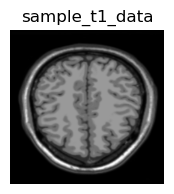

In [11]:
sample_t1_data = next(iter(t1_data_resize))
plt.figure(figsize=(2, 2))
plt.imshow(sample_t1_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('sample_t1_data')
plt.axis('off')
plt.show()

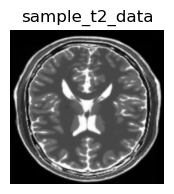

In [12]:
sample_t2_data = next(iter(t2_data_resize))
plt.figure(figsize=(2, 2))
plt.imshow(sample_t2_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('sample_t2_data')
plt.axis('off')
plt.show()

## Model Building & Training
The architecture of generator is a modified U-Net.

1. We create the generator & discriminator

2. We define the loss functions

3. We create the train_step function

#### Instance Normalization
Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.

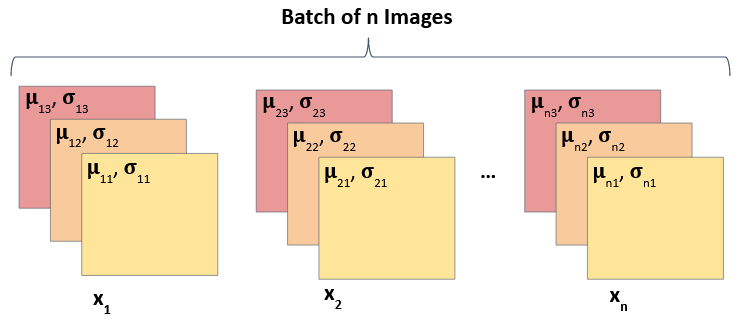

#### Downsampling
Downsampling is performed using the Convolution, leading to reduce in dimensions.

#### Upsampling
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [13]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    if apply_norm:
        result.add(InstanceNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

#### Unets
Unets takes Image as an input and translate it into another Image. <p>
To do this they first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image. <p>
Let's understand it through the below image.

<center>

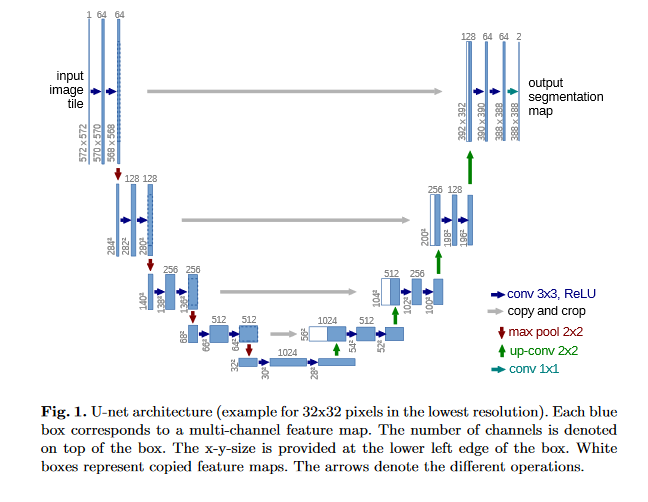

</center>

In [14]:
def unet_generator():
   
    down_stack = [
      downsample(64, 4, apply_norm=False), 
      downsample(128, 4), 
      downsample(256, 4),  
      downsample(512, 4),  
      downsample(512, 4), 
      downsample(512, 4),  
      downsample(512, 4),  
      downsample(512, 4),  
    ]
                  #create a stack of downsample models
    up_stack = [
      upsample(512, 4, apply_dropout=True),  
      upsample(512, 4, apply_dropout=True),  
      upsample(512, 4, apply_dropout=True),  
      upsample(512, 4),  
      upsample(256, 4),  
      upsample(128, 4),  
      upsample(64, 4),  
               ] #create a stack of upsample models
        
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') 
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[None, None, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Generator
Generator is a Unet Network here since we want to translate One type of Image (MRI T1) into Another type of Image (MRI T2) and vice versa.

In [15]:
generator_g = unet_generator() #initialise the generator
generator_f = unet_generator() #initialise the generator

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [16]:
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[None, None, 1], name='input_image')
    x = inp
    down1 = downsample(64, 4,  False)(x)  #write your code to downsample X
    down2 = downsample(128, 4)(down1)     #write your code to downsample down1
    down3 = downsample(256, 4)(down2)     #write your code to downsample down2
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  
    return tf.keras.Model(inputs=inp, outputs=last) #create the model using input & output layer

In [17]:
discriminator_x = discriminator() #initialise the discriminator
discriminator_y = discriminator() #initialise the discriminator

Lets take a look at the initial performance of the generators (before training)

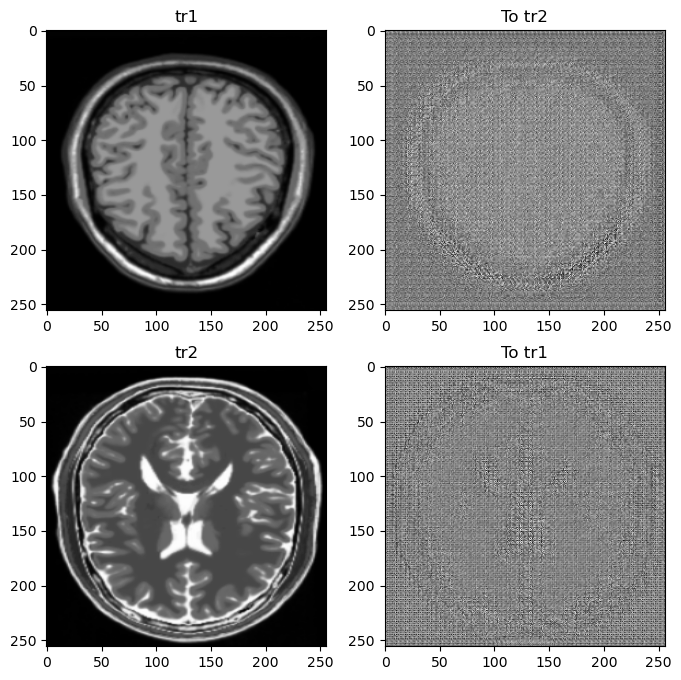

In [18]:
to_t2 = generator_g(sample_t1_data)
to_t1 = generator_f(sample_t2_data)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_t1_data, to_t2, sample_t2_data, to_t1]
title = ['tr1', 'To tr2', 'tr2', 'To tr1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    else:
        plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 * contrast + 0.5, cmap='gray')
plt.show()

### Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

In [19]:
LAMBDA = 10

#### Declare Loss as Binary Cross Entropy
Since Our Discriminator is a classifier

In [20]:
# Using Binarycross entropy with logits true
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

In [21]:
# calculating discriminator loss by summing the real and generated
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real) #write your code here
    generated_loss = loss_obj(tf.zeros_like(generated), generated) #write your code here
    total_disc_loss = real_loss + generated_loss #write your code here
    return total_disc_loss * 0.5

#### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

In [22]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

#### Cycle Loss
When we use both of Generators sequentially on a Input Image, we get Cycle Image and the L1 Loss between these two is called Cycle Loss.

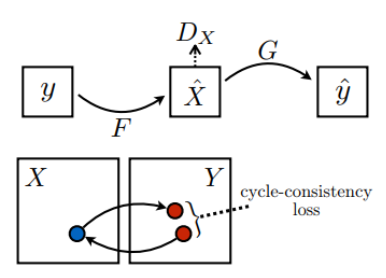

In [23]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image)) #write your code here
    return LAMBDA * loss1

#### Identity Loss
When we provide input image to the Generator such that no translation is needed because the Image is already transformed. Here also we take L1 Loss between Input and Output Image.

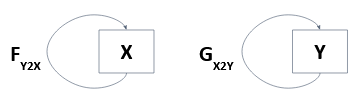

In [24]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

#### Optimizer 
We use Adam Optimizer to update weights which is a good optimizer to achieve quick learning.

In [25]:
# Optimizer with learning rate 0.0001 for generator and discriminator
generator_g_optimizer = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

We'll train out Model for 125 Epochs

In [26]:
EPOCHS = 125 

#### Checkpoint Initialization
We will initialize checkpoints to save models

In [27]:

checkpoint_path = './checkpoints'  
ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=EPOCHS)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

We will define a function to show Images output by Generators while Training

In [28]:
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Training FLow
Below Function performs one Flow of Batch Training 

Sequence of Training Flow:


1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.



In [29]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X.
        fake_y = generator_g(real_x, training=True)  #write your code to generate images using Generator_g on real_x
        cycled_x = generator_f(fake_y, training=True) #write your code to generate images susiing Generator_f on fake_y
        
        fake_x =  generator_f(real_y, training=True) #write your code to generate images using Generator_f on real_y
        cycled_y = generator_g(fake_x, training=True) #write your code to generate images using Generator_g on fake_x
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True) #write your code to generate images using Generator_f on real_x
        same_y = generator_g(real_y, training=True) #write your code to generate images using Generator_g on real_y
        
        disc_real_x =  discriminator_x(real_x, training=True) #write your code to discriminate images using Discriminator_x on real_x
        disc_real_y = discriminator_y(real_y, training=True) #write your code to discriminate images using Discriminator_y on real_y
        
        disc_fake_x = discriminator_x(fake_x, training=True) #write your code to discriminate images using Discriminator_x on fake_x
        disc_fake_y = discriminator_y(fake_y, training=True) #write your code to discriminate images using Discriminator_y on fake_y
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y) # calculate the generator_loss for disc_fake_
        gen_f_loss = generator_loss(disc_fake_x) # calculate the generator_loss for disc_fake_X 
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
 #calculate the total cycle loss
        
        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x) # calculate the discriminator_loss for disc_fake_x wrt disc_real_x
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y) # calculate the discriminator_loss foor disc_fake_y wrt disc_real_y
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables) #write your code here
    generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables) #write your code here
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables) #write your code here
    discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
 #write your code here
    
    # Apply the gradients to the optimizer
    
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables)) #write your code here
    


#### Training the CycleGAN Model for several Epochs
Loop training the function is done for number of epochs and we also show the output at each step.

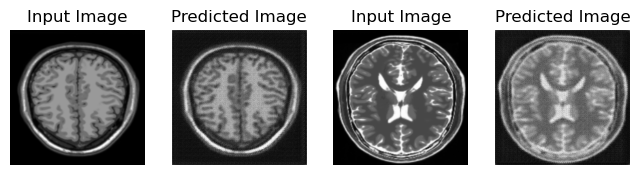

Saving checkpoint for epoch 1 at ./checkpoints\ckpt-1


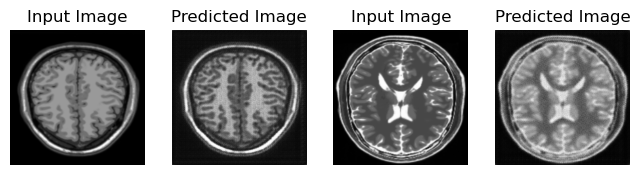

Saving checkpoint for epoch 2 at ./checkpoints\ckpt-2


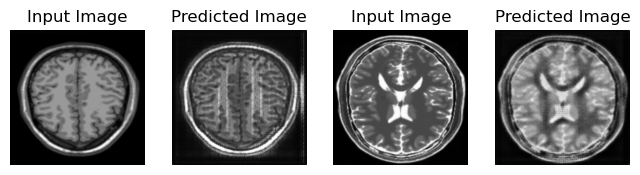

Saving checkpoint for epoch 3 at ./checkpoints\ckpt-3


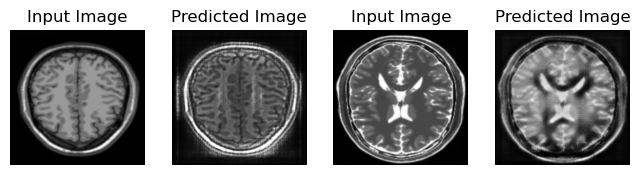

Saving checkpoint for epoch 4 at ./checkpoints\ckpt-4


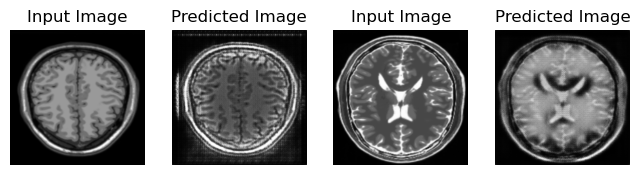

Saving checkpoint for epoch 5 at ./checkpoints\ckpt-5


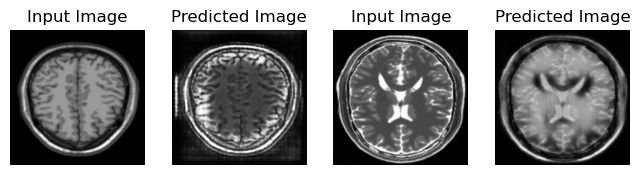

Saving checkpoint for epoch 6 at ./checkpoints\ckpt-6


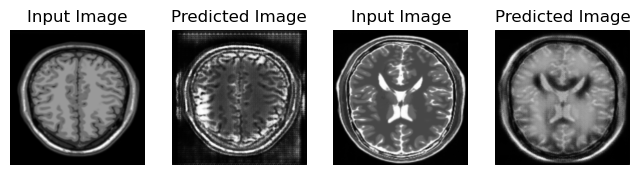

Saving checkpoint for epoch 7 at ./checkpoints\ckpt-7


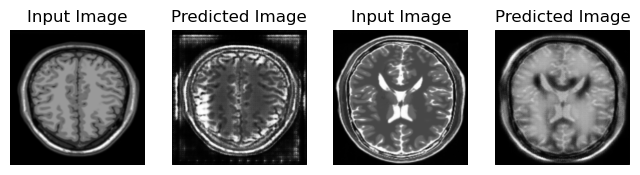

Saving checkpoint for epoch 8 at ./checkpoints\ckpt-8


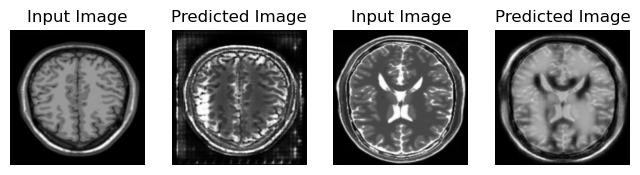

Saving checkpoint for epoch 9 at ./checkpoints\ckpt-9


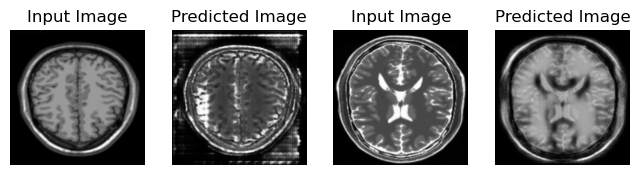

Saving checkpoint for epoch 10 at ./checkpoints\ckpt-10


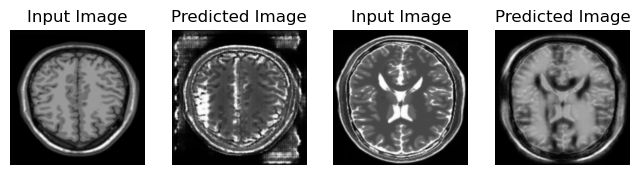

Saving checkpoint for epoch 11 at ./checkpoints\ckpt-11


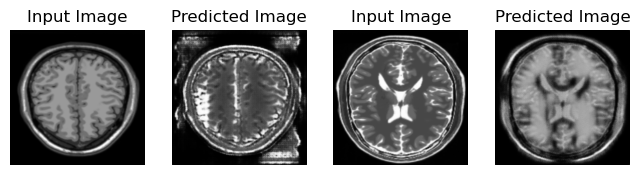

Saving checkpoint for epoch 12 at ./checkpoints\ckpt-12


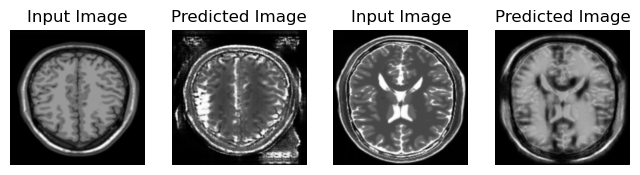

Saving checkpoint for epoch 13 at ./checkpoints\ckpt-13


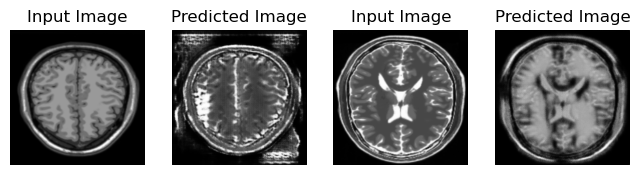

Saving checkpoint for epoch 14 at ./checkpoints\ckpt-14


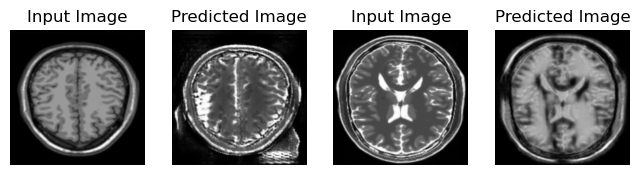

Saving checkpoint for epoch 15 at ./checkpoints\ckpt-15


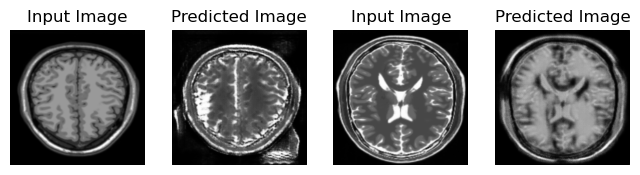

Saving checkpoint for epoch 16 at ./checkpoints\ckpt-16


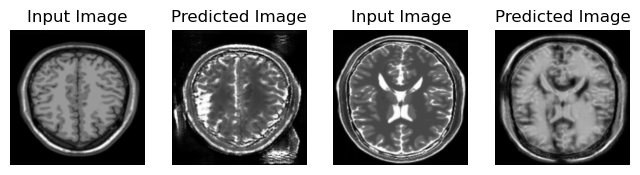

Saving checkpoint for epoch 17 at ./checkpoints\ckpt-17


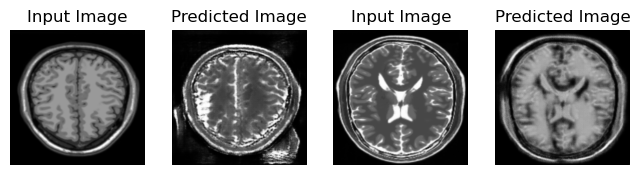

Saving checkpoint for epoch 18 at ./checkpoints\ckpt-18


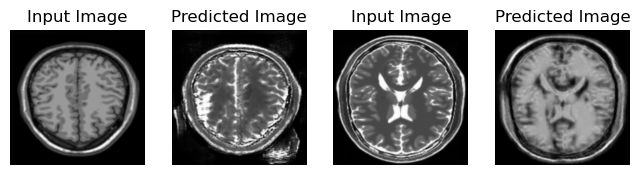

Saving checkpoint for epoch 19 at ./checkpoints\ckpt-19


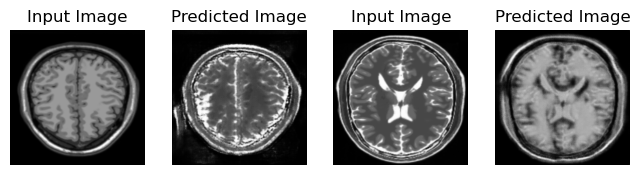

Saving checkpoint for epoch 20 at ./checkpoints\ckpt-20


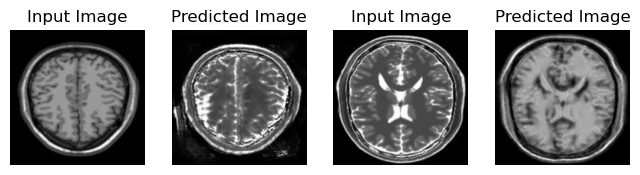

Saving checkpoint for epoch 21 at ./checkpoints\ckpt-21


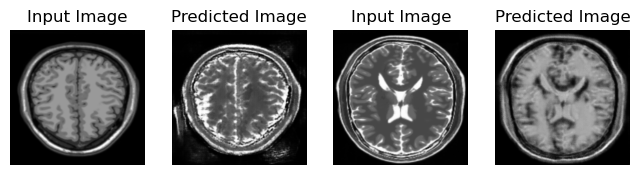

Saving checkpoint for epoch 22 at ./checkpoints\ckpt-22


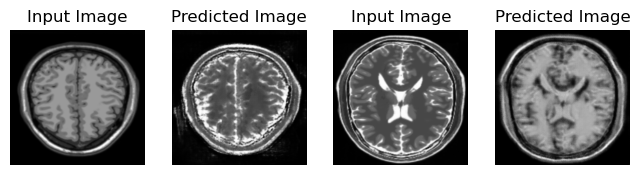

Saving checkpoint for epoch 23 at ./checkpoints\ckpt-23


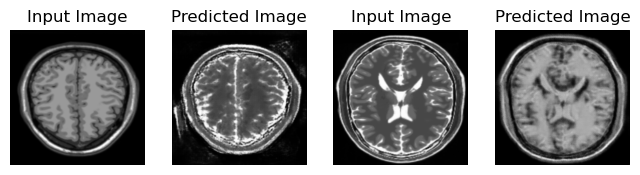

Saving checkpoint for epoch 24 at ./checkpoints\ckpt-24


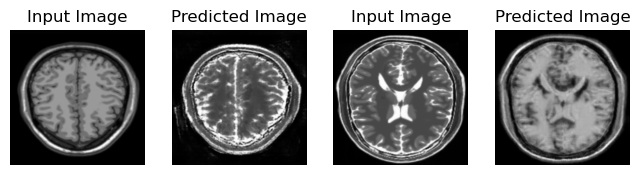

Saving checkpoint for epoch 25 at ./checkpoints\ckpt-25


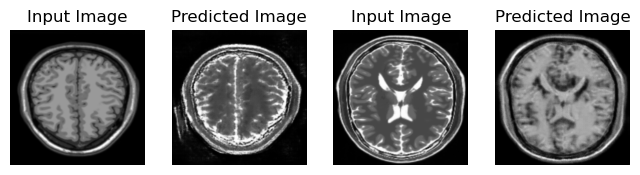

Saving checkpoint for epoch 26 at ./checkpoints\ckpt-26


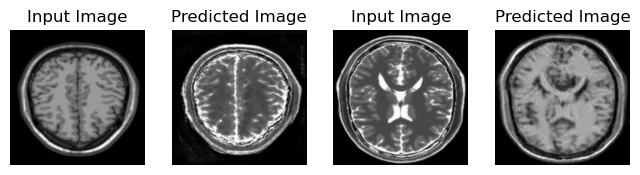

Saving checkpoint for epoch 27 at ./checkpoints\ckpt-27


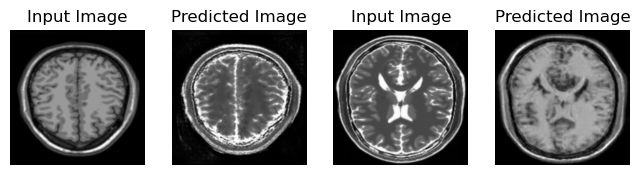

Saving checkpoint for epoch 28 at ./checkpoints\ckpt-28


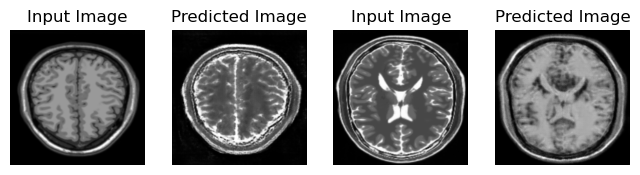

Saving checkpoint for epoch 29 at ./checkpoints\ckpt-29


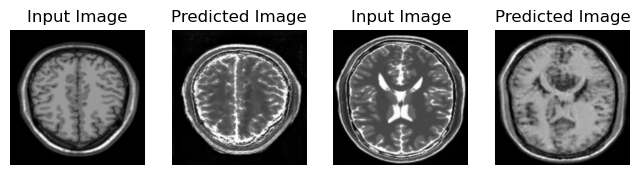

Saving checkpoint for epoch 30 at ./checkpoints\ckpt-30


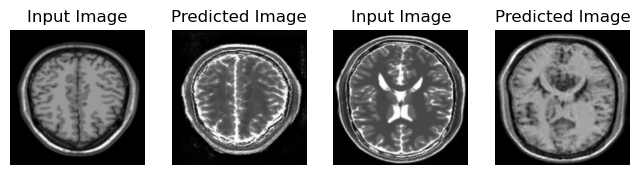

Saving checkpoint for epoch 31 at ./checkpoints\ckpt-31


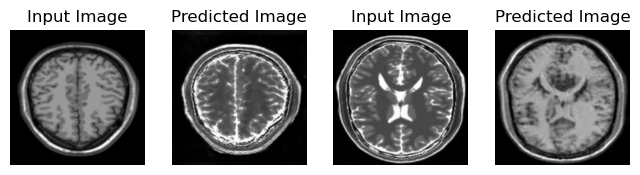

Saving checkpoint for epoch 32 at ./checkpoints\ckpt-32


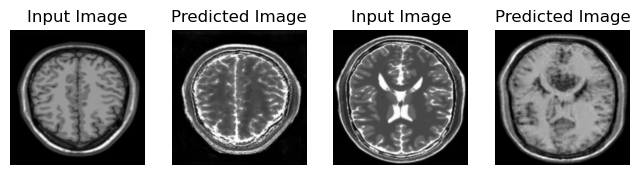

Saving checkpoint for epoch 33 at ./checkpoints\ckpt-33


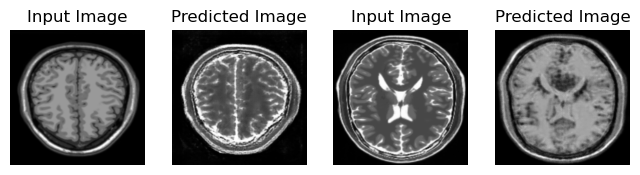

Saving checkpoint for epoch 34 at ./checkpoints\ckpt-34


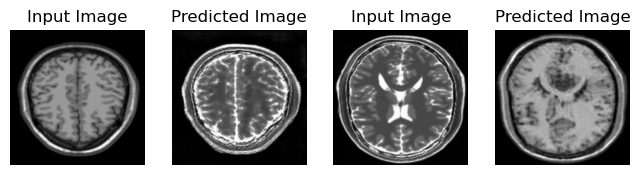

Saving checkpoint for epoch 35 at ./checkpoints\ckpt-35


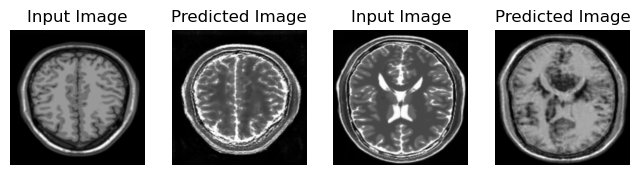

Saving checkpoint for epoch 36 at ./checkpoints\ckpt-36


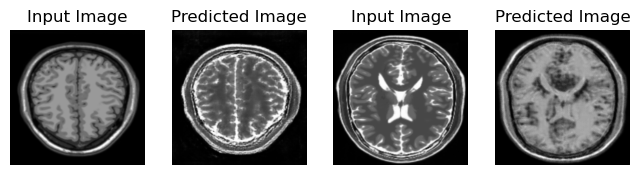

Saving checkpoint for epoch 37 at ./checkpoints\ckpt-37


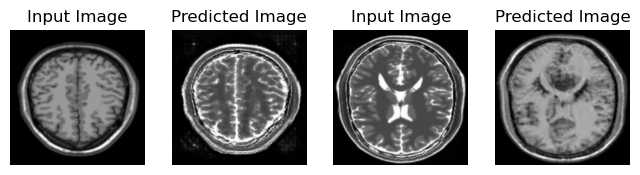

Saving checkpoint for epoch 38 at ./checkpoints\ckpt-38


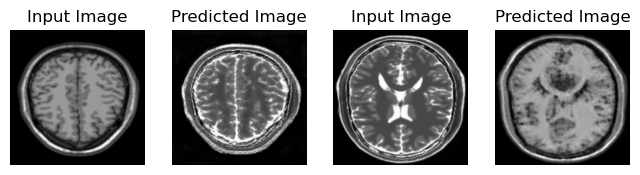

Saving checkpoint for epoch 39 at ./checkpoints\ckpt-39


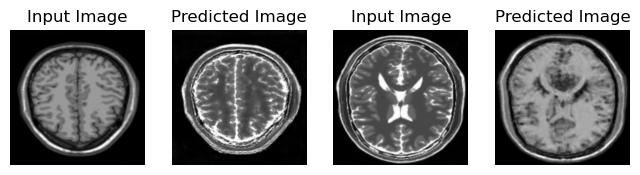

Saving checkpoint for epoch 40 at ./checkpoints\ckpt-40


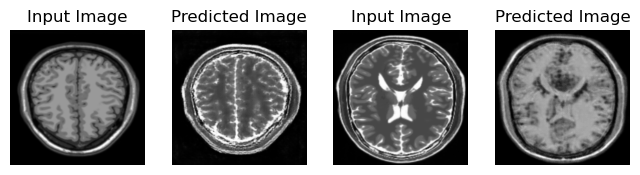

Saving checkpoint for epoch 41 at ./checkpoints\ckpt-41


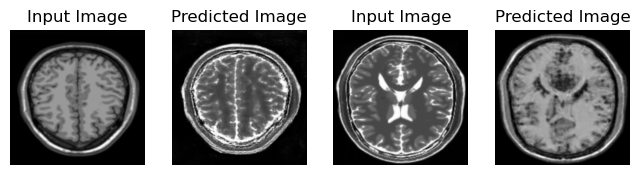

Saving checkpoint for epoch 42 at ./checkpoints\ckpt-42


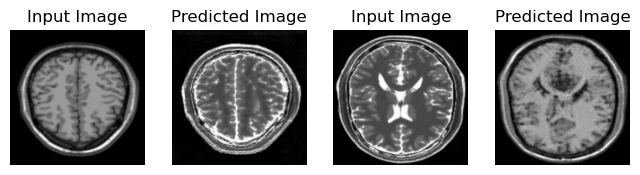

Saving checkpoint for epoch 43 at ./checkpoints\ckpt-43


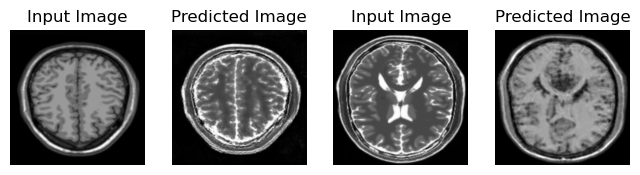

Saving checkpoint for epoch 44 at ./checkpoints\ckpt-44


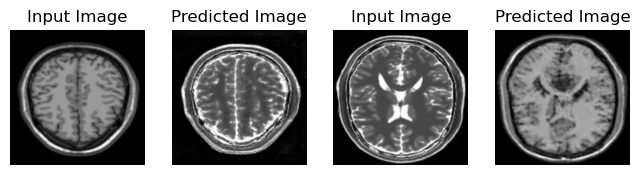

Saving checkpoint for epoch 45 at ./checkpoints\ckpt-45


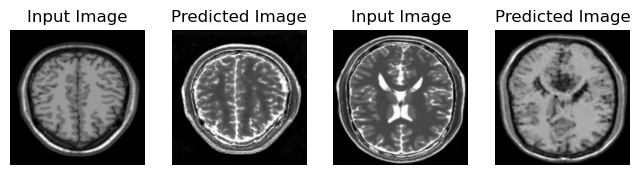

Saving checkpoint for epoch 46 at ./checkpoints\ckpt-46


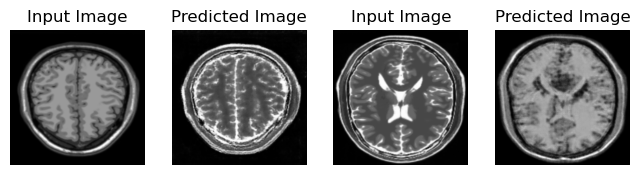

Saving checkpoint for epoch 47 at ./checkpoints\ckpt-47


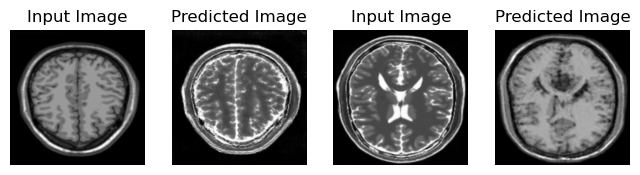

Saving checkpoint for epoch 48 at ./checkpoints\ckpt-48


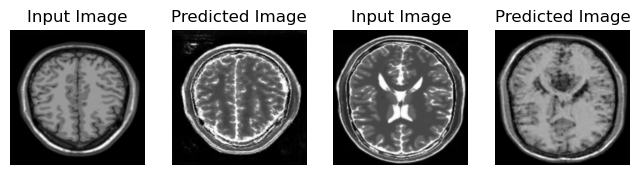

Saving checkpoint for epoch 49 at ./checkpoints\ckpt-49


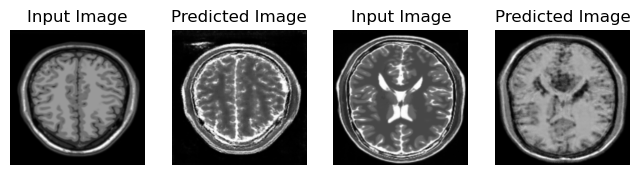

Saving checkpoint for epoch 50 at ./checkpoints\ckpt-50


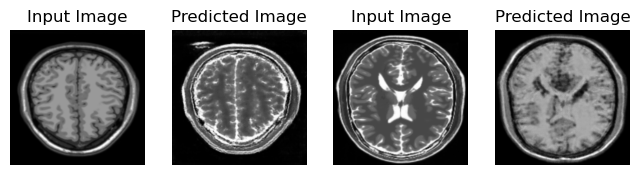

Saving checkpoint for epoch 51 at ./checkpoints\ckpt-51


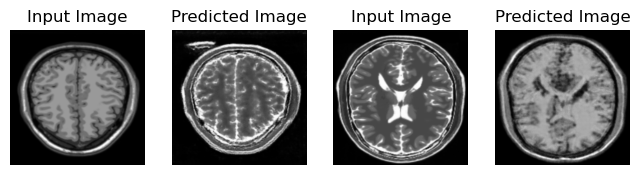

Saving checkpoint for epoch 52 at ./checkpoints\ckpt-52


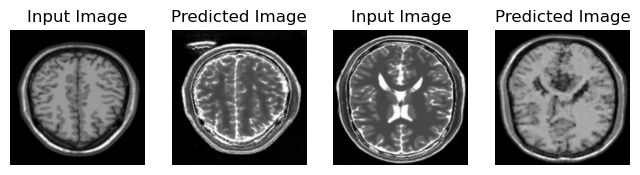

Saving checkpoint for epoch 53 at ./checkpoints\ckpt-53


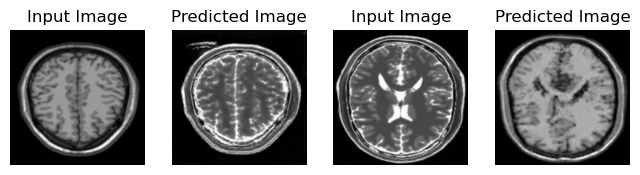

Saving checkpoint for epoch 54 at ./checkpoints\ckpt-54


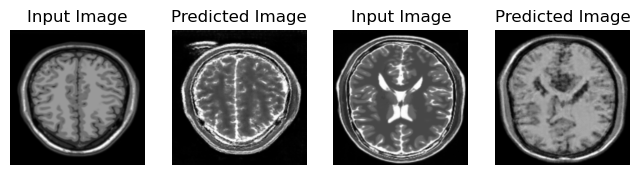

Saving checkpoint for epoch 55 at ./checkpoints\ckpt-55


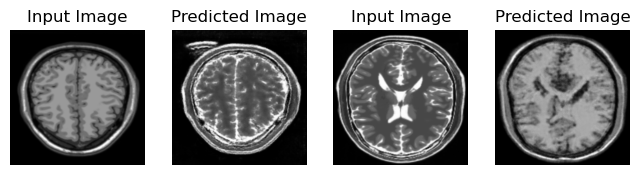

Saving checkpoint for epoch 56 at ./checkpoints\ckpt-56


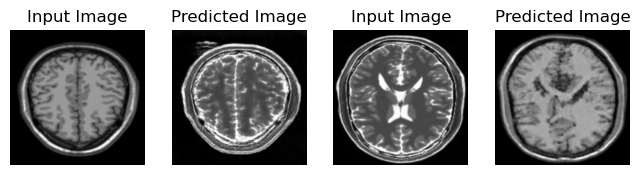

Saving checkpoint for epoch 57 at ./checkpoints\ckpt-57


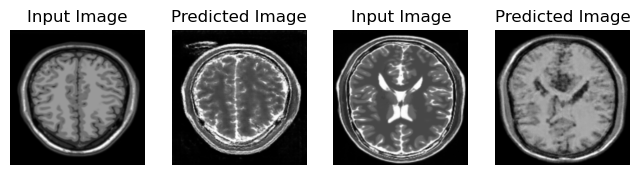

Saving checkpoint for epoch 58 at ./checkpoints\ckpt-58


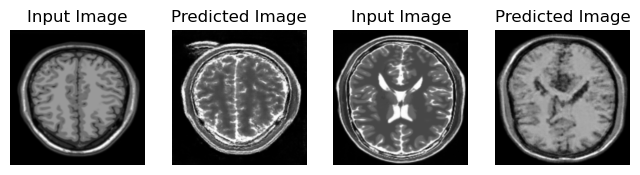

Saving checkpoint for epoch 59 at ./checkpoints\ckpt-59


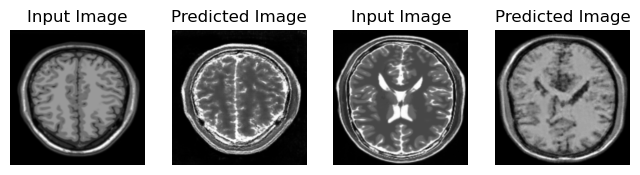

Saving checkpoint for epoch 60 at ./checkpoints\ckpt-60


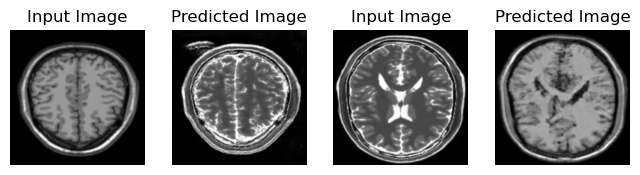

Saving checkpoint for epoch 61 at ./checkpoints\ckpt-61


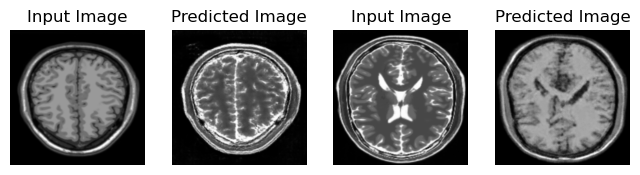

Saving checkpoint for epoch 62 at ./checkpoints\ckpt-62


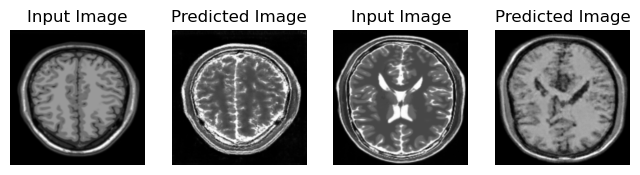

Saving checkpoint for epoch 63 at ./checkpoints\ckpt-63


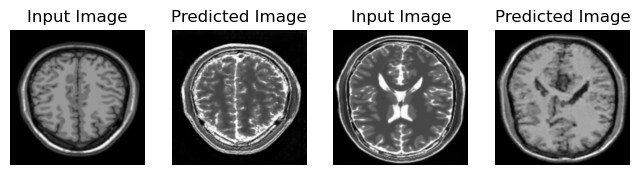

Saving checkpoint for epoch 64 at ./checkpoints\ckpt-64


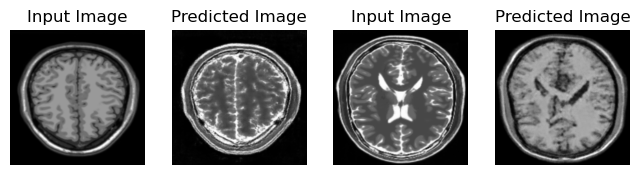

Saving checkpoint for epoch 65 at ./checkpoints\ckpt-65


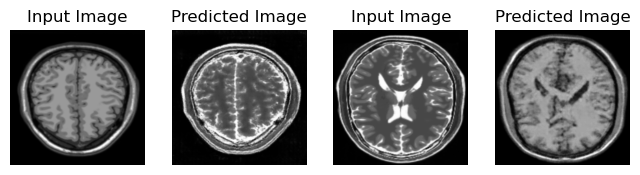

Saving checkpoint for epoch 66 at ./checkpoints\ckpt-66


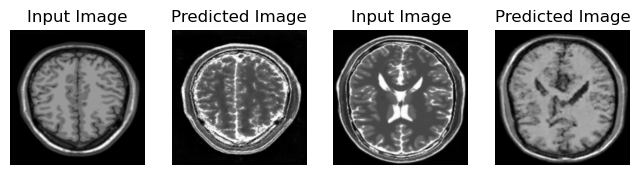

Saving checkpoint for epoch 67 at ./checkpoints\ckpt-67


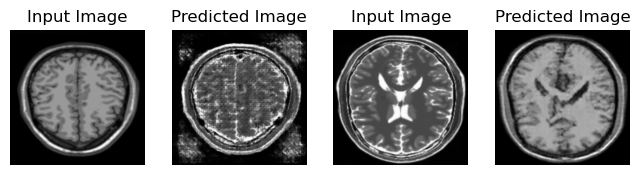

Saving checkpoint for epoch 68 at ./checkpoints\ckpt-68


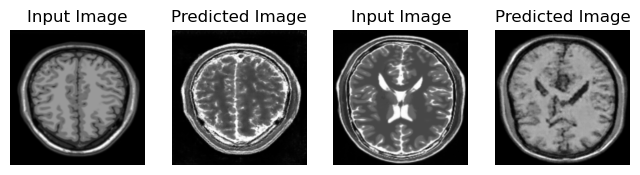

Saving checkpoint for epoch 69 at ./checkpoints\ckpt-69


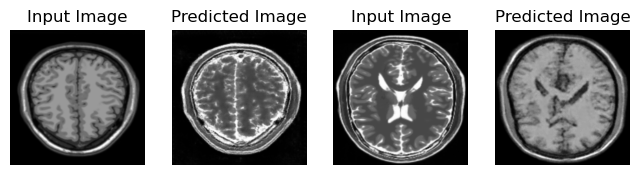

Saving checkpoint for epoch 70 at ./checkpoints\ckpt-70


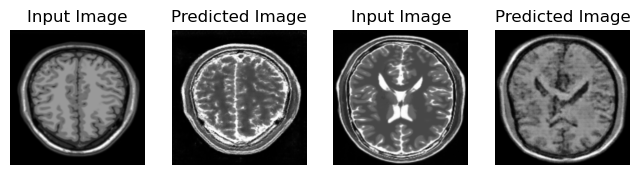

Saving checkpoint for epoch 71 at ./checkpoints\ckpt-71


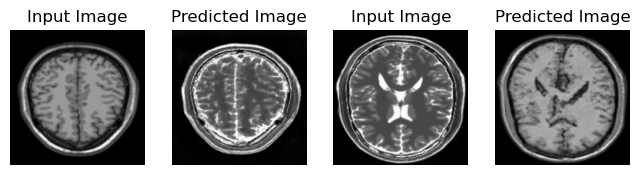

Saving checkpoint for epoch 72 at ./checkpoints\ckpt-72


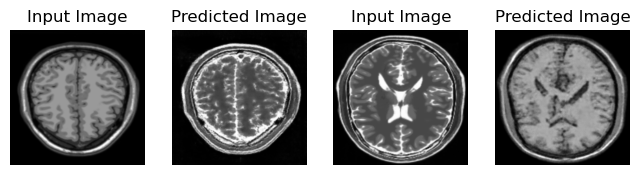

Saving checkpoint for epoch 73 at ./checkpoints\ckpt-73


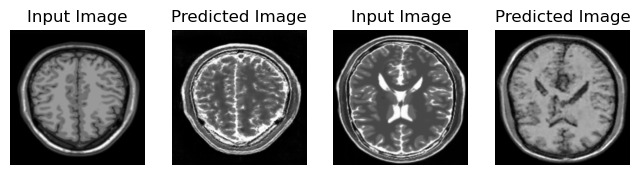

Saving checkpoint for epoch 74 at ./checkpoints\ckpt-74


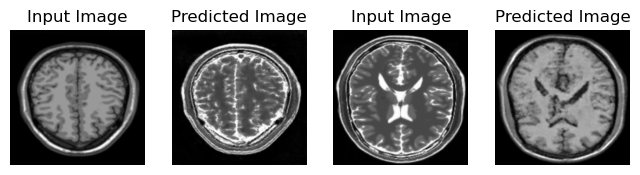

Saving checkpoint for epoch 75 at ./checkpoints\ckpt-75


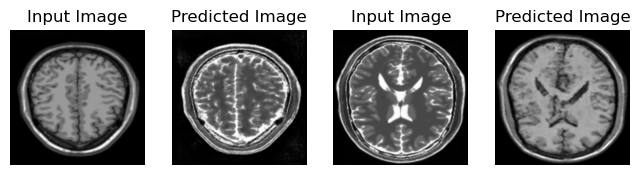

Saving checkpoint for epoch 76 at ./checkpoints\ckpt-76


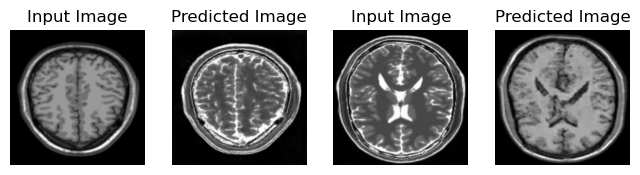

Saving checkpoint for epoch 77 at ./checkpoints\ckpt-77


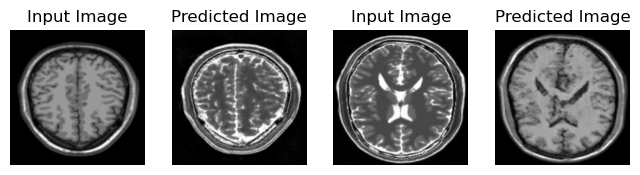

Saving checkpoint for epoch 78 at ./checkpoints\ckpt-78


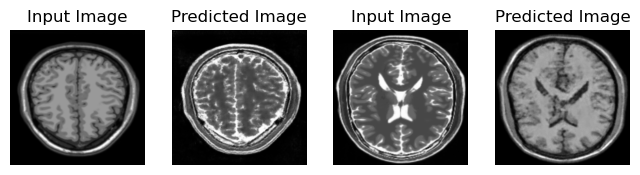

Saving checkpoint for epoch 79 at ./checkpoints\ckpt-79


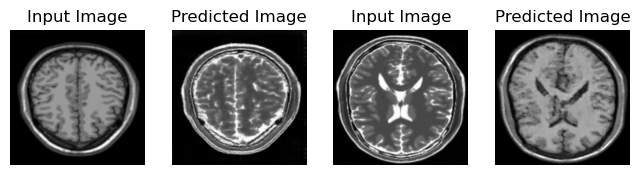

Saving checkpoint for epoch 80 at ./checkpoints\ckpt-80


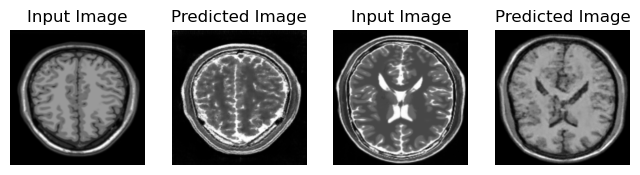

Saving checkpoint for epoch 81 at ./checkpoints\ckpt-81


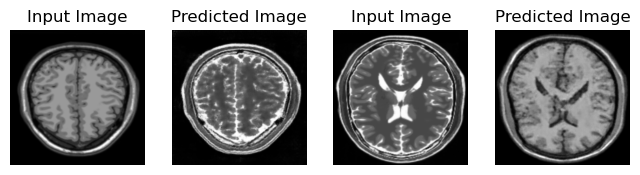

Saving checkpoint for epoch 82 at ./checkpoints\ckpt-82


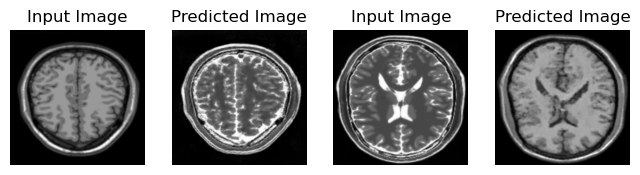

Saving checkpoint for epoch 83 at ./checkpoints\ckpt-83


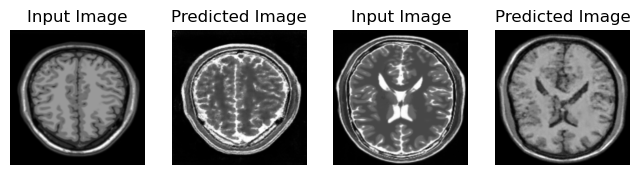

Saving checkpoint for epoch 84 at ./checkpoints\ckpt-84


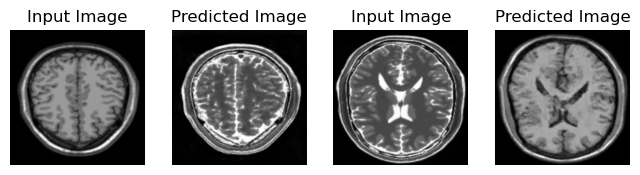

Saving checkpoint for epoch 85 at ./checkpoints\ckpt-85


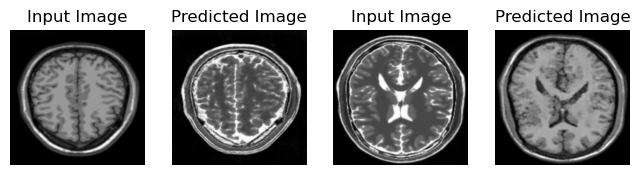

Saving checkpoint for epoch 86 at ./checkpoints\ckpt-86


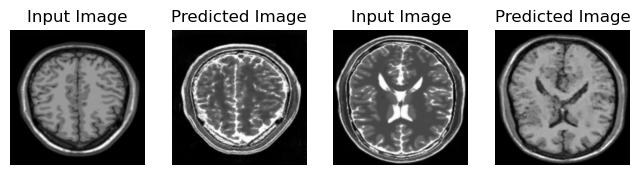

Saving checkpoint for epoch 87 at ./checkpoints\ckpt-87


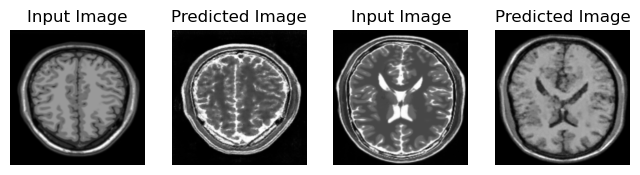

Saving checkpoint for epoch 88 at ./checkpoints\ckpt-88


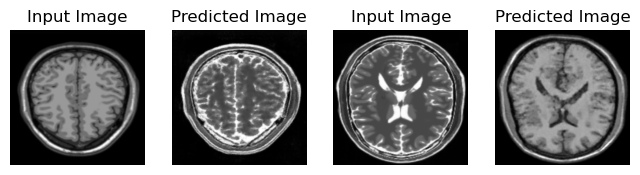

Saving checkpoint for epoch 89 at ./checkpoints\ckpt-89


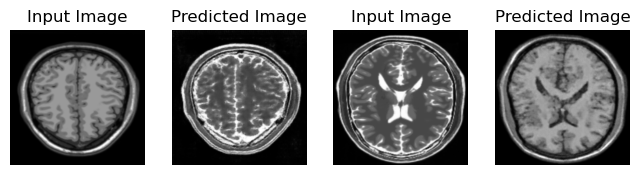

Saving checkpoint for epoch 90 at ./checkpoints\ckpt-90


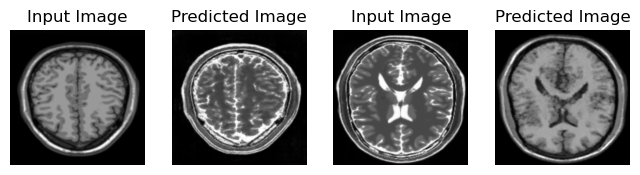

Saving checkpoint for epoch 91 at ./checkpoints\ckpt-91


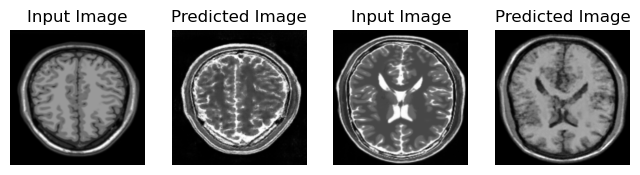

Saving checkpoint for epoch 92 at ./checkpoints\ckpt-92


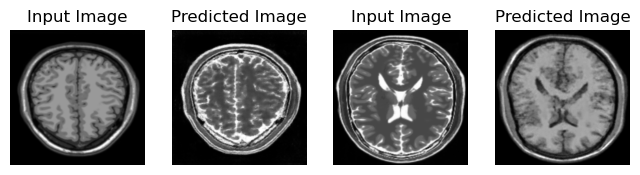

Saving checkpoint for epoch 93 at ./checkpoints\ckpt-93


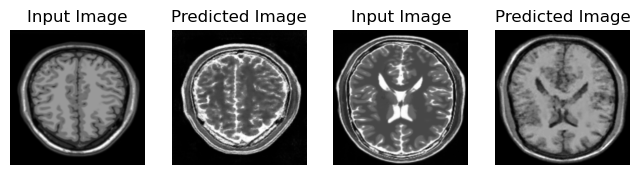

Saving checkpoint for epoch 94 at ./checkpoints\ckpt-94


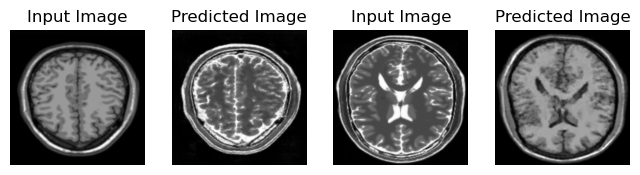

Saving checkpoint for epoch 95 at ./checkpoints\ckpt-95


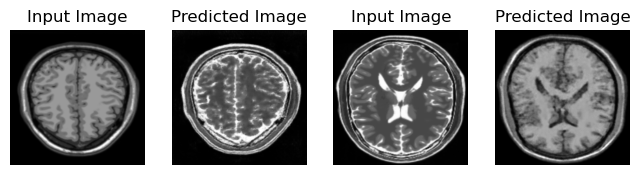

Saving checkpoint for epoch 96 at ./checkpoints\ckpt-96


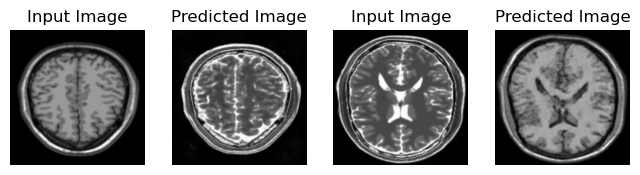

Saving checkpoint for epoch 97 at ./checkpoints\ckpt-97


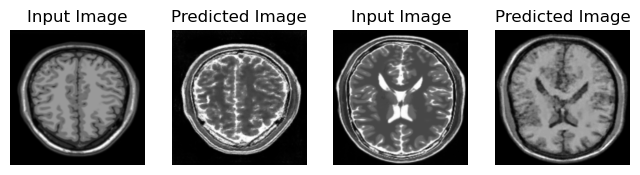

Saving checkpoint for epoch 98 at ./checkpoints\ckpt-98


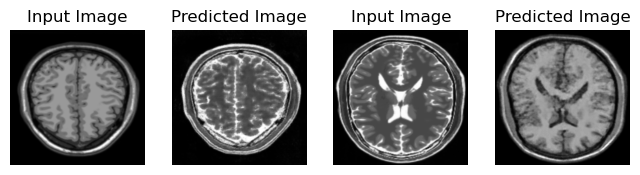

Saving checkpoint for epoch 99 at ./checkpoints\ckpt-99


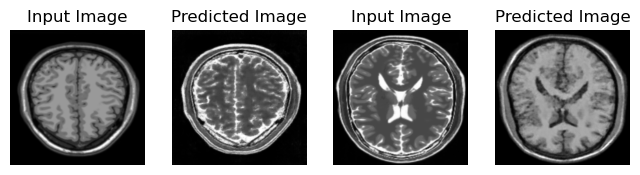

Saving checkpoint for epoch 100 at ./checkpoints\ckpt-100


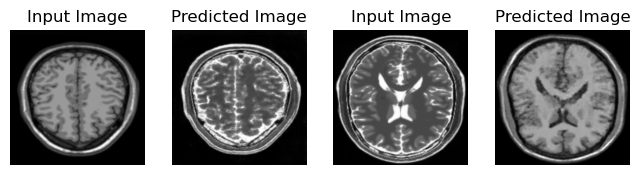

Saving checkpoint for epoch 101 at ./checkpoints\ckpt-101


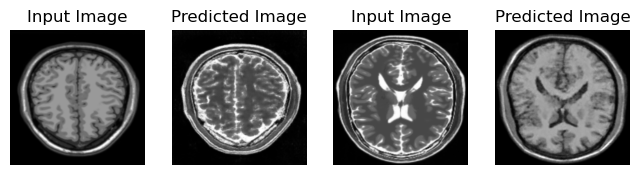

Saving checkpoint for epoch 102 at ./checkpoints\ckpt-102


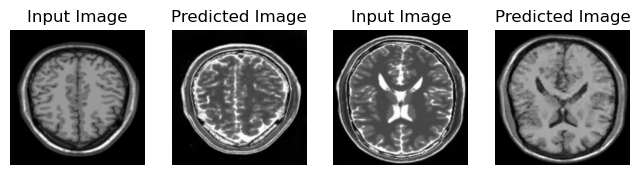

Saving checkpoint for epoch 103 at ./checkpoints\ckpt-103


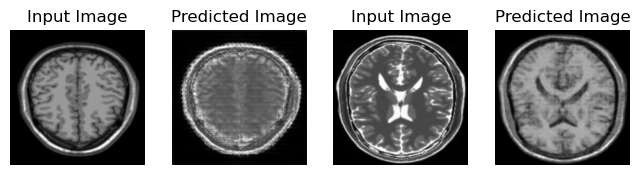

Saving checkpoint for epoch 104 at ./checkpoints\ckpt-104


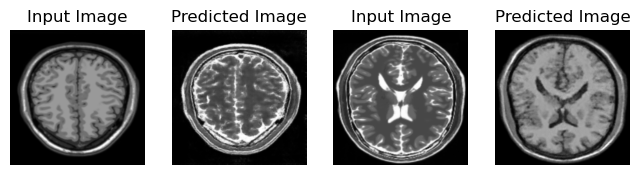

Saving checkpoint for epoch 105 at ./checkpoints\ckpt-105


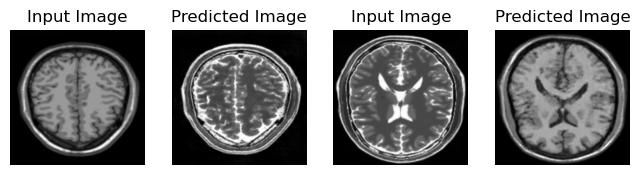

Saving checkpoint for epoch 106 at ./checkpoints\ckpt-106


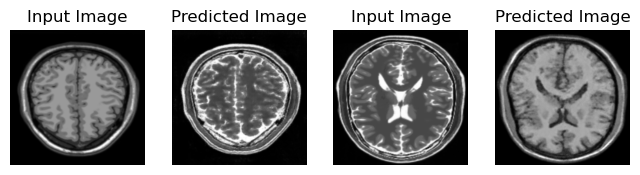

Saving checkpoint for epoch 107 at ./checkpoints\ckpt-107


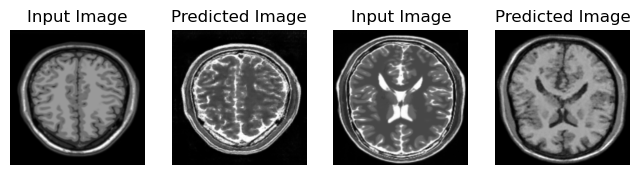

Saving checkpoint for epoch 108 at ./checkpoints\ckpt-108


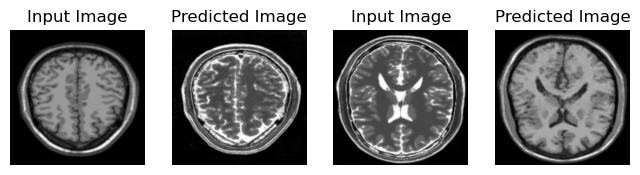

Saving checkpoint for epoch 109 at ./checkpoints\ckpt-109


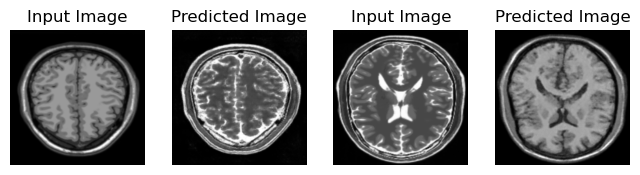

Saving checkpoint for epoch 110 at ./checkpoints\ckpt-110


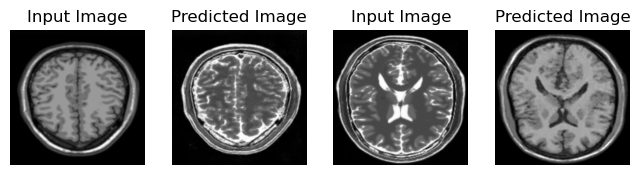

Saving checkpoint for epoch 111 at ./checkpoints\ckpt-111


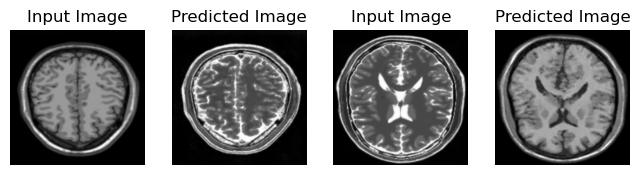

Saving checkpoint for epoch 112 at ./checkpoints\ckpt-112


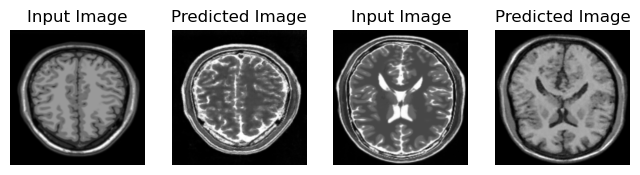

Saving checkpoint for epoch 113 at ./checkpoints\ckpt-113


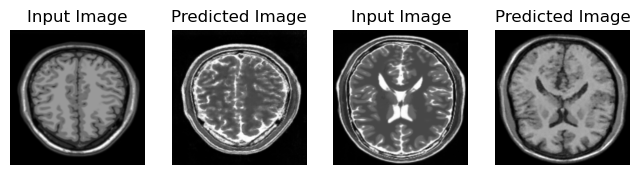

Saving checkpoint for epoch 114 at ./checkpoints\ckpt-114


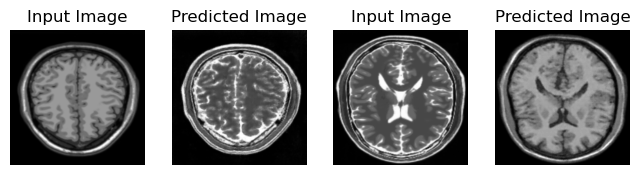

Saving checkpoint for epoch 115 at ./checkpoints\ckpt-115


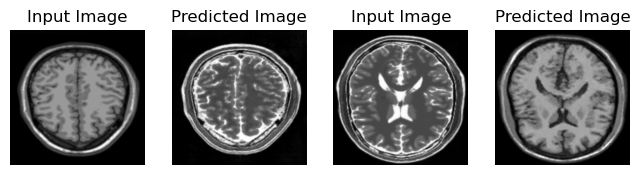

Saving checkpoint for epoch 116 at ./checkpoints\ckpt-116


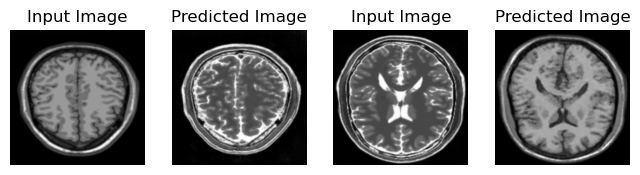

Saving checkpoint for epoch 117 at ./checkpoints\ckpt-117


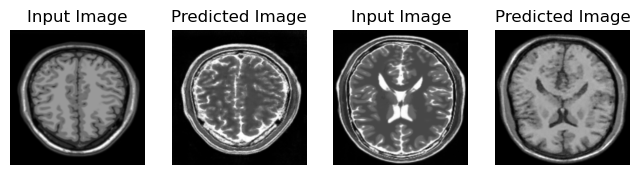

Saving checkpoint for epoch 118 at ./checkpoints\ckpt-118


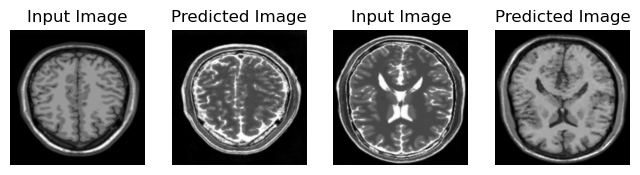

Saving checkpoint for epoch 119 at ./checkpoints\ckpt-119


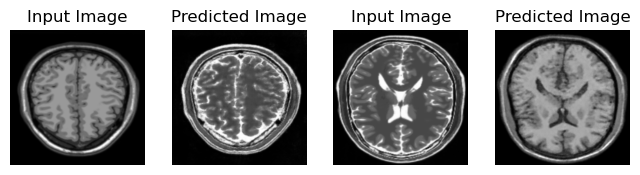

Saving checkpoint for epoch 120 at ./checkpoints\ckpt-120


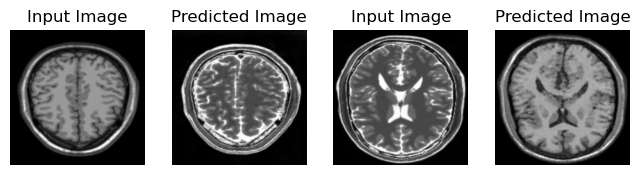

Saving checkpoint for epoch 121 at ./checkpoints\ckpt-121


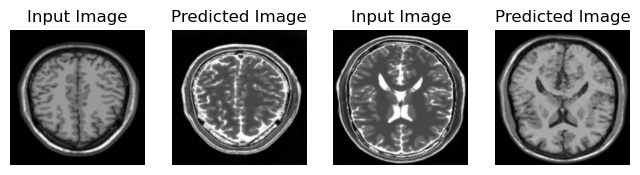

Saving checkpoint for epoch 122 at ./checkpoints\ckpt-122


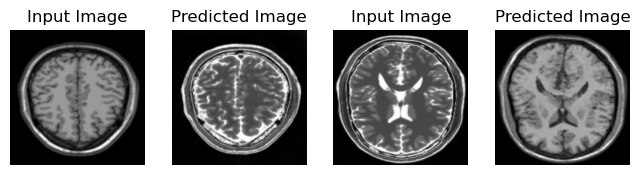

Saving checkpoint for epoch 123 at ./checkpoints\ckpt-123


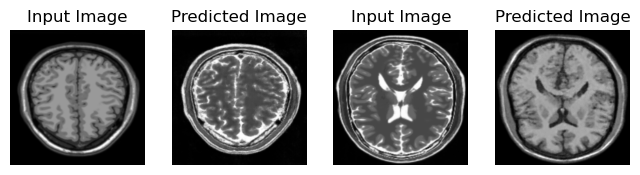

Saving checkpoint for epoch 124 at ./checkpoints\ckpt-124


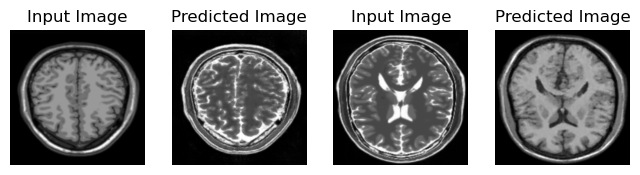

Saving checkpoint for epoch 125 at ./checkpoints\ckpt-125


In [30]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((t1_data_resize, t2_data_resize)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_t1_data, generator_f, sample_t2_data)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Generating a GIF for visualization of Results

In [31]:
anim_file = 'cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

C:\Users\PRATIK SINHA\AppData\Local\Temp\ipykernel_19996\3274524612.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
C:\Users\PRATIK SINHA\AppData\Local\Temp\ipykernel_19996\3274524612.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



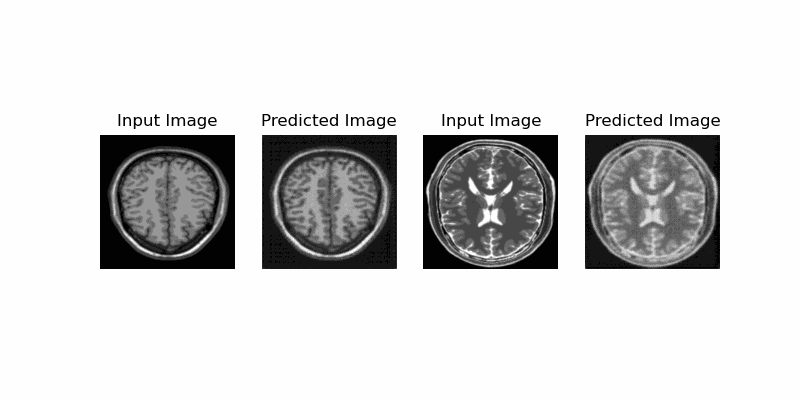

In [32]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)